# Algorithms for Masking Impulse Noise - Examples

In [1]:
import os
import subprocess

import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.dates import date2num

import echopype as ep
import echopype.mask
from echopype.testing import TEST_DATA_FOLDER

**The code below ensures that test data is locally available by downloading it from the specified FTP server if it isn't found in the 'echopype/echopype/test_data' directory.**
- After ensuring the data is available, the code processes the raw sonar data to obtain the Volume Backscattering Strength (`source_Sv`) for analysis.
- A specific sonar frequency channel (`desired_channel`) is also defined for potential impulse noise mask identification.

In [2]:
file_name = "JR230-D20091215-T121917.raw"
ftp_main = "ftp://ftp.bas.ac.uk"
ftp_partial_path = "/rapidkrill/ek60/"

test_data_path: str = os.path.join(
    TEST_DATA_FOLDER,
    file_name,
)
    

def set_up():
    "Gets the test data if it doesn't already exist"
    if not os.path.exists(TEST_DATA_FOLDER):
        os.mkdir(TEST_DATA_FOLDER)
    if not os.path.exists(test_data_path):
        ftp_file_path = ftp_main + ftp_partial_path + file_name
        subprocess.run(["wget", ftp_file_path, "-O", test_data_path])
        
        
def get_sv_dataset(file_path: str) -> xr.DataArray:
    set_up()
    ed = ep.open_raw(file_path, sonar_model="ek60")
    Sv = ep.calibrate.compute_Sv(ed).compute()
    return Sv


source_Sv = get_sv_dataset(test_data_path)
desired_channel = "GPT 120 kHz 00907203422d 1 ES120-7"

In [3]:
source_Sv

<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 572,
                                    range_sample: 3782, filenames: 1, time3: 572)
Coordinates:
  * channel                        (channel) object 'GPT  38 kHz 009072033fa5...
  * ping_time                      (ping_time) datetime64[ns] 2009-12-15T12:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 3779 3780 3781
  * filenames                      (filenames) int64 0
  * time3                          (time3) datetime64[ns] 2009-12-15T12:19:16...
Data variables: (12/16)
    Sv                             (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 3.8e+04 1.2e+05 2e+05
    sound_speed                    (channel, ping_time) float64 1.446e+03 ......
    sound_absorption               (channel, ping_time) float64 0.00972 ... 0...
    sa_correction                  (ping_time, channel) float64 -0.63 ... -0.31
    ...                             ...
    angle_sensitivity_alongship    (channel, ping_time) float64 22.0 ... 23.0
    angle_sensitivity_athwartship  (channel, ping_time) float64 22.0 ... 23.0
    beamwidth_alongship            (channel, ping_time) float64 7.0 7.0 ... 6.44
    beamwidth_athwartship          (channel, ping_time) float64 7.1 7.1 ... 6.43
    source_filenames               (filenames) <U118 '/Users/simedroniraluca/...
    water_level                    (channel, time3) float64 0.0 0.0 ... 0.0 0.0
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2285+g595ff46
    processing_time:              2023-08-20T11:57:44Z
    processing_function:          calibrate.compute_Sv

## Impulse Noise

- Impulse noise is characterized by sudden, sharp spikes in the data due to high energy bursts.

**Echogram before noise identification**

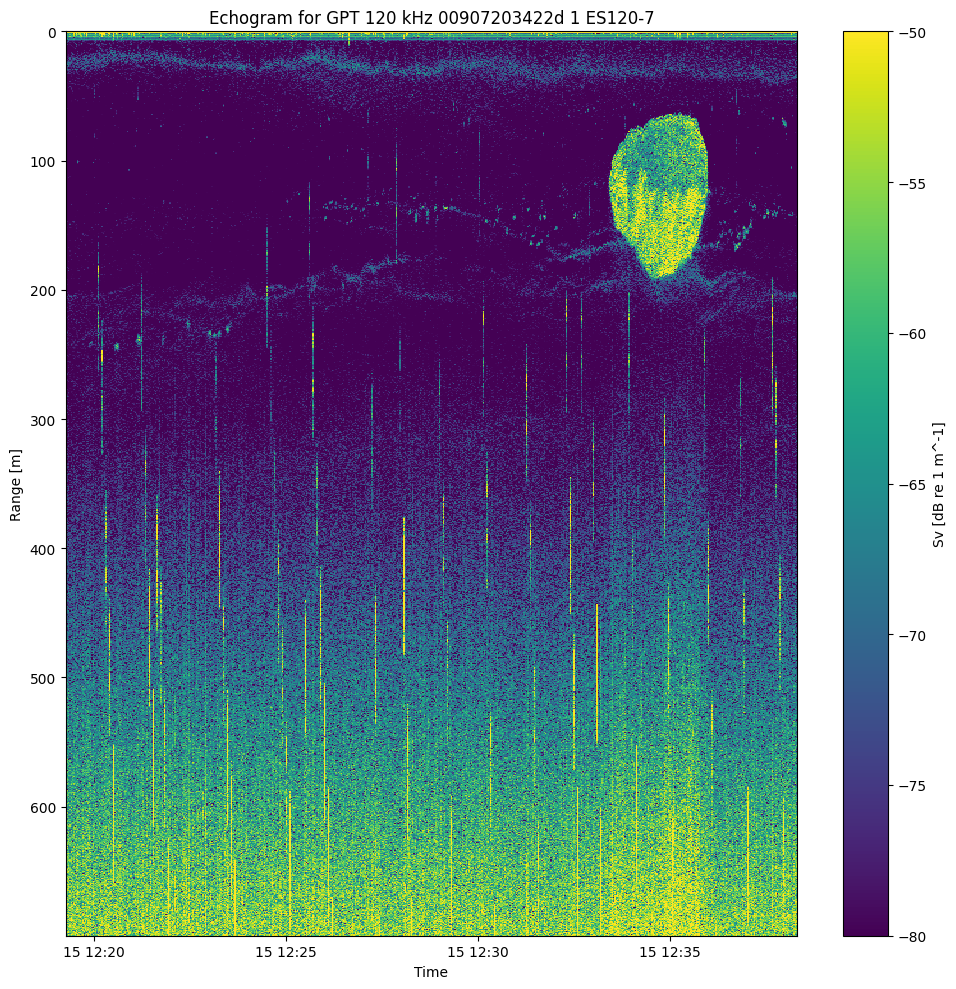

In [4]:
# Select the data from the desired channel
Sv_ds = source_Sv

Sv = Sv_ds['Sv'].sel(channel=desired_channel)
ping_time = Sv_ds['ping_time']
range_sample = Sv_ds['echo_range'].sel(channel=desired_channel)

# Create the echogram
plt.figure(figsize=(10,10))
plt.pcolormesh(ping_time, range_sample.T, Sv.T, cmap='viridis', vmin=-80, vmax=-50)
plt.gca().invert_yaxis()
plt.colorbar(label='Sv [dB re 1 m^-1]')
plt.ylabel('Range [m]')
plt.xlabel('Time')
plt.title(f'Echogram for {desired_channel}')
plt.tight_layout()
plt.show()

**Specific masking techniques for noise**

**Ryan method**
 - Mask impulse noise following the two-sided comparison method described  in: Ryan et al. (2015) ‘Reducing bias due to noise and attenuation in open-ocean echo integration data’, ICES Journal of Marine Science, 72: 2482–2493.

In [5]:
# Obtain the Sv without impulse noise.
# 1. Generate an impulse noise mask using the "ryan" method with the specified parameters.
# 2. Apply this mask to the source_Sv to filter out impulse noise.

mask = echopype.mask.get_impulse_noise_mask(source_Sv, desired_channel, thr=10, m=5, n=1, method="ryan")
Sv_in = echopype.mask.apply_mask(
    source_Sv,
    mask
) 

Sv_in

<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 572,
                                    range_sample: 3782, filenames: 1, time3: 572)
Coordinates:
  * channel                        (channel) object 'GPT  38 kHz 009072033fa5...
  * ping_time                      (ping_time) datetime64[ns] 2009-12-15T12:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 3779 3780 3781
  * filenames                      (filenames) int64 0
  * time3                          (time3) datetime64[ns] 2009-12-15T12:19:16...
Data variables: (12/16)
    Sv                             (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 3.8e+04 1.2e+05 2e+05
    sound_speed                    (channel, ping_time) float64 1.446e+03 ......
    sound_absorption               (channel, ping_time) float64 0.00972 ... 0...
    sa_correction                  (ping_time, channel) float64 -0.63 ... -0.31
    ...                             ...
    angle_sensitivity_alongship    (channel, ping_time) float64 22.0 ... 23.0
    angle_sensitivity_athwartship  (channel, ping_time) float64 22.0 ... 23.0
    beamwidth_alongship            (channel, ping_time) float64 7.0 7.0 ... 6.44
    beamwidth_athwartship          (channel, ping_time) float64 7.1 7.1 ... 6.43
    source_filenames               (filenames) <U118 '/Users/simedroniraluca/...
    water_level                    (channel, time3) float64 0.0 0.0 ... 0.0 0.0
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2285+g595ff46
    processing_time:              2023-08-20T11:57:44Z
    processing_function:          calibrate.compute_Sv
    mask_software_name:           echopype
    mask_software_version:        0.1.dev2285+g595ff46
    mask_time:                    2023-08-20T11:57:47Z
    mask_function:                mask.apply_mask

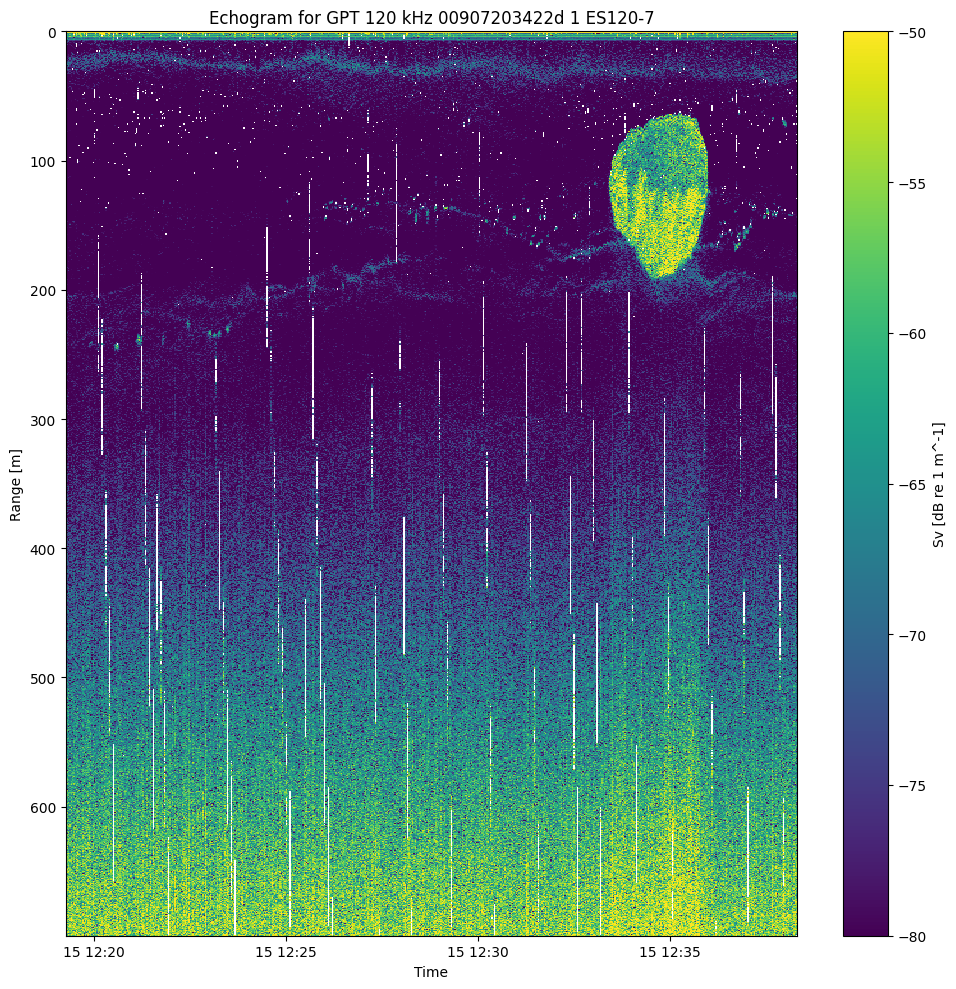

In [6]:
# Create the echogram
Sv = Sv_in['Sv'].sel(channel=desired_channel)
ping_time = Sv_in['ping_time']
range_sample = Sv_in['echo_range'].sel(channel=desired_channel)

plt.figure(figsize=(10,10))
plt.pcolormesh(ping_time, range_sample.T, Sv.T, cmap='viridis', vmin=-80, vmax=-50)
plt.gca().invert_yaxis()
plt.colorbar(label='Sv [dB re 1 m^-1]')
plt.ylabel('Range [m]')
plt.xlabel('Time')
plt.title(f'Echogram for {desired_channel}')
plt.tight_layout()
plt.show()

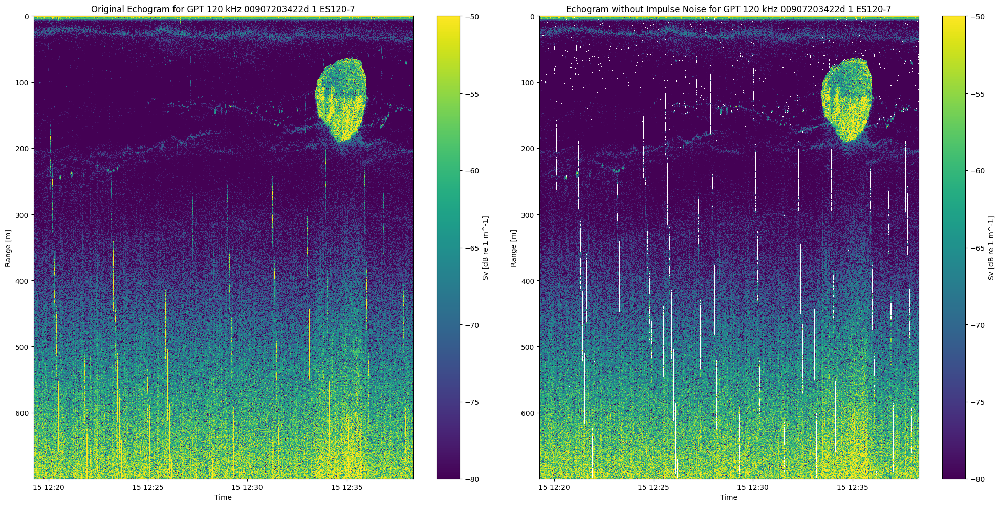

In [7]:
# Select the data from the desired channel
Sv_ds = source_Sv

# Echogram for source_Sv
Sv = Sv_ds['Sv'].sel(channel=desired_channel)
ping_time = Sv_ds['ping_time']
range_sample = Sv_ds['echo_range'].sel(channel=desired_channel)

# Create a single figure for both echograms
plt.figure(figsize=(20, 10)) 

# Create the first echogram (original Sv)
plt.subplot(1, 2, 1)
plt.pcolormesh(ping_time, range_sample.T, Sv.T, cmap='viridis', vmin=-80, vmax=-50)
plt.gca().invert_yaxis()
plt.colorbar(label='Sv [dB re 1 m^-1]')
plt.ylabel('Range [m]')
plt.xlabel('Time')
plt.title(f'Original Echogram for {desired_channel}')

# Echogram for Sv_in (after applying mask)
Sv = Sv_in['Sv'].sel(channel=desired_channel)
ping_time = Sv_in['ping_time']
range_sample = Sv_in['echo_range'].sel(channel=desired_channel)

# Create the second echogram (Sv without impulse noise)
plt.subplot(1, 2, 2)
plt.pcolormesh(ping_time, range_sample.T, Sv.T, cmap='viridis', vmin=-80, vmax=-50)
plt.gca().invert_yaxis()
plt.colorbar(label='Sv [dB re 1 m^-1]')
plt.ylabel('Range [m]')
plt.xlabel('Time')
plt.title(f'Echogram without Impulse Noise for {desired_channel}')

plt.tight_layout()
plt.show()


**Ryan iterable method**

- Modified from "Ryan" so that the number of pings (either side for comparisons) can be provided multiple times. It enables the algorithm to iterate and perform comparisons at different number of pings (either side for comparisons) distances. Resulting masks at each iteration are combined in a single mask.


In [8]:
# Obtain the Sv without impulse noise.
# 1. Generate an impulse noise mask using the "ryan_iterable" method with the specified parameters.
# 2. Apply this mask to the source_Sv to filter out impulse noise.

mask = echopype.mask.get_impulse_noise_mask(source_Sv, desired_channel, thr=10, m=5, n=(1,2),method='ryan_iterable')
Sv_in = echopype.mask.apply_mask(
    source_Sv,
    mask
) 

Sv_in

<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 572,
                                    range_sample: 3782, filenames: 1, time3: 572)
Coordinates:
  * channel                        (channel) object 'GPT  38 kHz 009072033fa5...
  * ping_time                      (ping_time) datetime64[ns] 2009-12-15T12:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 3779 3780 3781
  * filenames                      (filenames) int64 0
  * time3                          (time3) datetime64[ns] 2009-12-15T12:19:16...
Data variables: (12/16)
    Sv                             (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 3.8e+04 1.2e+05 2e+05
    sound_speed                    (channel, ping_time) float64 1.446e+03 ......
    sound_absorption               (channel, ping_time) float64 0.00972 ... 0...
    sa_correction                  (ping_time, channel) float64 -0.63 ... -0.31
    ...                             ...
    angle_sensitivity_alongship    (channel, ping_time) float64 22.0 ... 23.0
    angle_sensitivity_athwartship  (channel, ping_time) float64 22.0 ... 23.0
    beamwidth_alongship            (channel, ping_time) float64 7.0 7.0 ... 6.44
    beamwidth_athwartship          (channel, ping_time) float64 7.1 7.1 ... 6.43
    source_filenames               (filenames) <U118 '/Users/simedroniraluca/...
    water_level                    (channel, time3) float64 0.0 0.0 ... 0.0 0.0
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2285+g595ff46
    processing_time:              2023-08-20T11:57:44Z
    processing_function:          calibrate.compute_Sv
    mask_software_name:           echopype
    mask_software_version:        0.1.dev2285+g595ff46
    mask_time:                    2023-08-20T11:57:52Z
    mask_function:                mask.apply_mask

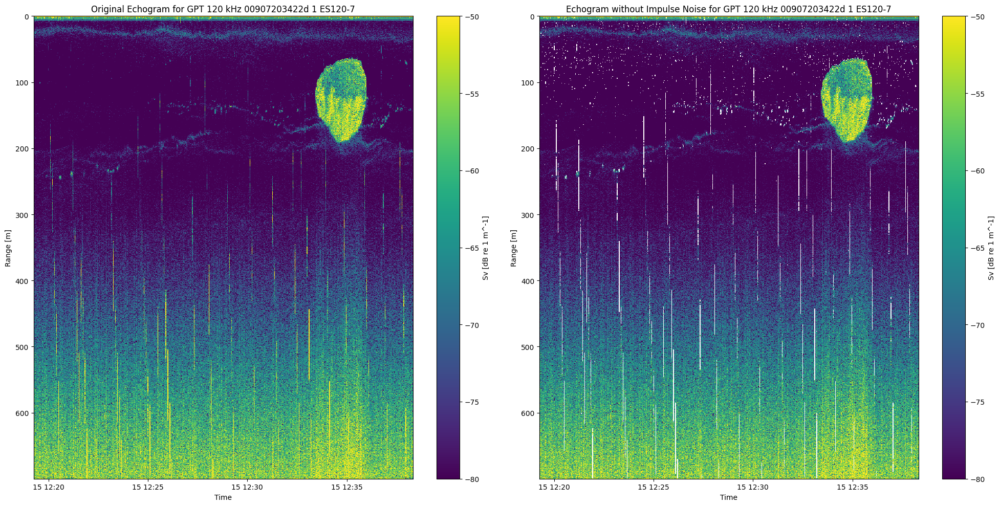

In [9]:
# Select the data from the desired channel
Sv_ds = source_Sv

# Echogram for source_Sv
Sv = Sv_ds['Sv'].sel(channel=desired_channel)
ping_time = Sv_ds['ping_time']
range_sample = Sv_ds['echo_range'].sel(channel=desired_channel)

# Create a single figure for both echograms
plt.figure(figsize=(20, 10)) 

# Create the first echogram (original Sv)
plt.subplot(1, 2, 1)
plt.pcolormesh(ping_time, range_sample.T, Sv.T, cmap='viridis', vmin=-80, vmax=-50)
plt.gca().invert_yaxis()
plt.colorbar(label='Sv [dB re 1 m^-1]')
plt.ylabel('Range [m]')
plt.xlabel('Time')
plt.title(f'Original Echogram for {desired_channel}')

# Echogram for Sv_in (after applying mask)
Sv = Sv_in['Sv'].sel(channel=desired_channel)
ping_time = Sv_in['ping_time']
range_sample = Sv_in['echo_range'].sel(channel=desired_channel)

# Create the second echogram (Sv without impulse noise)
plt.subplot(1, 2, 2)
plt.pcolormesh(ping_time, range_sample.T, Sv.T, cmap='viridis', vmin=-80, vmax=-50)
plt.gca().invert_yaxis()
plt.colorbar(label='Sv [dB re 1 m^-1]')
plt.ylabel('Range [m]')
plt.xlabel('Time')
plt.title(f'Echogram without Impulse Noise for {desired_channel}')

plt.tight_layout()
plt.show()

**Wang method**
- Wang et al. (2015) 'A noise removal algorithm for acoustic data with strong interference based on post-processing techniques', CCAMLR SG-ASAM: 15/02.

In [10]:
# Obtain the Sv without impulse noise.
# 1. Generate an impulse noise mask using the "wang" method with the specified parameters.
# 2. Apply this mask to the source_Sv to filter out impulse noise.

mask = mask = echopype.mask.get_impulse_noise_mask(source_Sv, desired_channel,\
                                                   thr=(-70,-40), erode=[(3,3)], dilate=[(5,5),(7,7)],\
                                                   median=[(7,7)],method='wang'\
                                                  )
Sv_in = echopype.mask.apply_mask(
    source_Sv,
    mask
) 

Sv_in

/Users/simedroniraluca/Documents/pineview/oceanstream_echopype/echopype/echopype/mask/mask_impulse_noise.py:327: UserWarning: Input Sv data contains NaN values.These values are not processed correctly by the impulse noise removal algorithmand will be marked as noise in the output mask.Please ensure that Sv data is cleaned or appropriately preprocessed before using this function.
  warnings.warn(
/Users/simedroniraluca/Documents/pineview/oceanstream_echopype/echopype/echopype/mask/mask_impulse_noise.py:376: UserWarning: The output mask from this function identifies regions of noise in the Sv data, but does not modify them in the same way as the `wang` function from echopy.Visualizations using this mask may therefore differ fromthose generated using the `wang` function from echopy. Be aware that regions marked as True in the mask are identified as noise.
  warnings.warn(


<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 572,
                                    range_sample: 3782, filenames: 1, time3: 572)
Coordinates:
  * channel                        (channel) object 'GPT  38 kHz 009072033fa5...
  * ping_time                      (ping_time) datetime64[ns] 2009-12-15T12:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 3779 3780 3781
  * filenames                      (filenames) int64 0
  * time3                          (time3) datetime64[ns] 2009-12-15T12:19:16...
Data variables: (12/16)
    Sv                             (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 3.8e+04 1.2e+05 2e+05
    sound_speed                    (channel, ping_time) float64 1.446e+03 ......
    sound_absorption               (channel, ping_time) float64 0.00972 ... 0...
    sa_correction                  (ping_time, channel) float64 -0.63 ... -0.31
    ...                             ...
    angle_sensitivity_alongship    (channel, ping_time) float64 22.0 ... 23.0
    angle_sensitivity_athwartship  (channel, ping_time) float64 22.0 ... 23.0
    beamwidth_alongship            (channel, ping_time) float64 7.0 7.0 ... 6.44
    beamwidth_athwartship          (channel, ping_time) float64 7.1 7.1 ... 6.43
    source_filenames               (filenames) <U118 '/Users/simedroniraluca/...
    water_level                    (channel, time3) float64 0.0 0.0 ... 0.0 0.0
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2285+g595ff46
    processing_time:              2023-08-20T11:57:44Z
    processing_function:          calibrate.compute_Sv
    mask_software_name:           echopype
    mask_software_version:        0.1.dev2285+g595ff46
    mask_time:                    2023-08-20T11:57:57Z
    mask_function:                mask.apply_mask

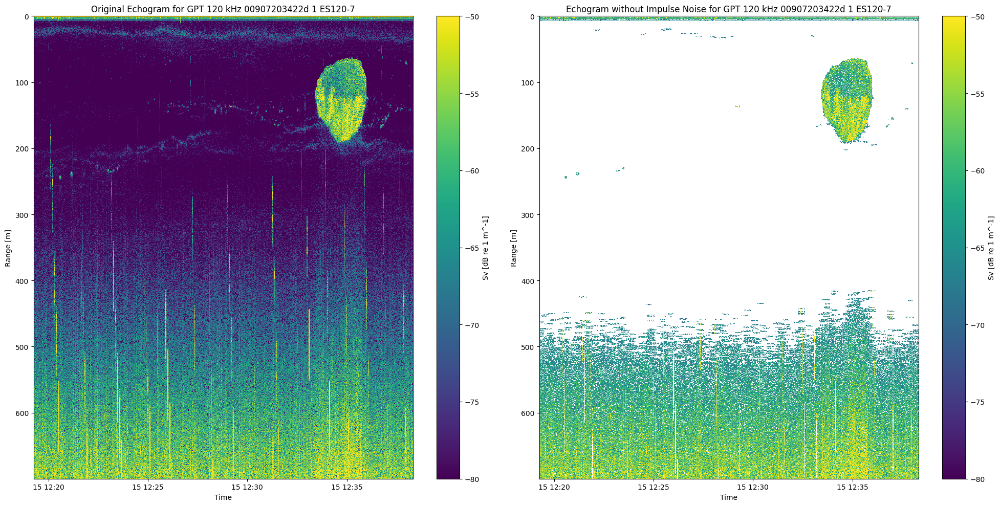

In [11]:
# Select the data from the desired channel
Sv_ds = source_Sv

# Echogram for source_Sv
Sv = Sv_ds['Sv'].sel(channel=desired_channel)
ping_time = Sv_ds['ping_time']
range_sample = Sv_ds['echo_range'].sel(channel=desired_channel)

# Create a single figure for both echograms
plt.figure(figsize=(20, 10)) 

# Create the first echogram (original Sv)
plt.subplot(1, 2, 1)
plt.pcolormesh(ping_time, range_sample.T, Sv.T, cmap='viridis', vmin=-80, vmax=-50)
plt.gca().invert_yaxis()
plt.colorbar(label='Sv [dB re 1 m^-1]')
plt.ylabel('Range [m]')
plt.xlabel('Time')
plt.title(f'Original Echogram for {desired_channel}')

# Echogram for Sv_in (after applying mask)
Sv = Sv_in['Sv'].sel(channel=desired_channel)
ping_time = Sv_in['ping_time']
range_sample = Sv_in['echo_range'].sel(channel=desired_channel)

# Create the second echogram (Sv without impulse noise)
plt.subplot(1, 2, 2)
plt.pcolormesh(ping_time, range_sample.T, Sv.T, cmap='viridis', vmin=-80, vmax=-50)
plt.gca().invert_yaxis()
plt.colorbar(label='Sv [dB re 1 m^-1]')
plt.ylabel('Range [m]')
plt.xlabel('Time')
plt.title(f'Echogram without Impulse Noise for {desired_channel}')

plt.tight_layout()
plt.show()